## Reading the data files

### Importing required libraries

In [1]:
!pip install pmdarima --quiet

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import pickle
import pmdarima

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss 
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from pmdarima.pipeline import Pipeline
from pmdarima.preprocessing import LogEndogTransformer, BoxCoxEndogTransformer
from pmdarima.arima import ARIMA
from datetime import datetime, timedelta

# sns.set_style('whitegrid')
# plt.style.use("fivethirtyeight")
# %matplotlib inline
warnings.filterwarnings("ignore")


[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


### Reading the dataset

In [2]:
df = pd.read_csv('station_day.csv')
df

,StationId,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,AP001,11/24/2017,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,0.17,5.92,0.10,NaN,NaN
1,AP001,11/25/2017,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,0.20,6.50,0.06,184.0,Moderate
2,AP001,11/26/2017,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,0.22,7.95,0.08,197.0,Moderate
3,AP001,11/27/2017,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,0.29,7.63,0.12,198.0,Moderate
4,AP001,11/28/2017,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,0.17,5.02,0.07,188.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108030,WB013,6/27/2020,8.65,16.46,NaN,NaN,NaN,NaN,0.69,4.36,30.59,1.32,7.26,NaN,50.0,Good
108031,WB013,6/28/2020,11.80,18.47,NaN,NaN,NaN,NaN,0.68,3.49,38.95,1.42,7.92,NaN,65.0,Satisfactory
108032,WB013,6/29/2020,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,3.52,8.64,NaN,63.0,Satisfactory
108033,WB013,6/30/2020,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,1.86,8.40,NaN,57.0,Satisfactory


In [4]:
data = df
data = data.replace([np.nan, -np.inf], 0)

In [5]:
data

,StationId,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,AP001,11/24/2017,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,0.17,5.92,0.10,0.0,0
1,AP001,11/25/2017,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,0.20,6.50,0.06,184.0,Moderate
2,AP001,11/26/2017,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,0.22,7.95,0.08,197.0,Moderate
3,AP001,11/27/2017,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,0.29,7.63,0.12,198.0,Moderate
4,AP001,11/28/2017,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,0.17,5.02,0.07,188.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108030,WB013,6/27/2020,8.65,16.46,0.00,0.00,0.00,0.00,0.69,4.36,30.59,1.32,7.26,0.00,50.0,Good
108031,WB013,6/28/2020,11.80,18.47,0.00,0.00,0.00,0.00,0.68,3.49,38.95,1.42,7.92,0.00,65.0,Satisfactory
108032,WB013,6/29/2020,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,3.52,8.64,0.00,63.0,Satisfactory
108033,WB013,6/30/2020,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,1.86,8.40,0.00,57.0,Satisfactory


In [6]:
data['Date'] = pd.to_datetime(data['Date'])

In [7]:
data.isnull().sum()

StationId     0
Date          0
PM2.5         0
PM10          0
NO            0
NO2           0
NOx           0
NH3           0
CO            0
SO2           0
O3            0
Benzene       0
Toluene       0
Xylene        0
AQI           0
AQI_Bucket    0
dtype: int64

In [8]:
data['Date'] = pd.to_datetime(data['Date'])

def imputation_mean(data, column, mean):
    data[column] = data[column].fillna(mean)
    return data

cols = ['PM2.5', 'PM10', 'O3', 'CO']
for c in cols:
    mean = data[c].mean()
    data = imputation_mean(data, c, mean)

data.isnull().sum()

StationId     0
Date          0
PM2.5         0
PM10          0
NO            0
NO2           0
NOx           0
NH3           0
CO            0
SO2           0
O3            0
Benzene       0
Toluene       0
Xylene        0
AQI           0
AQI_Bucket    0
dtype: int64

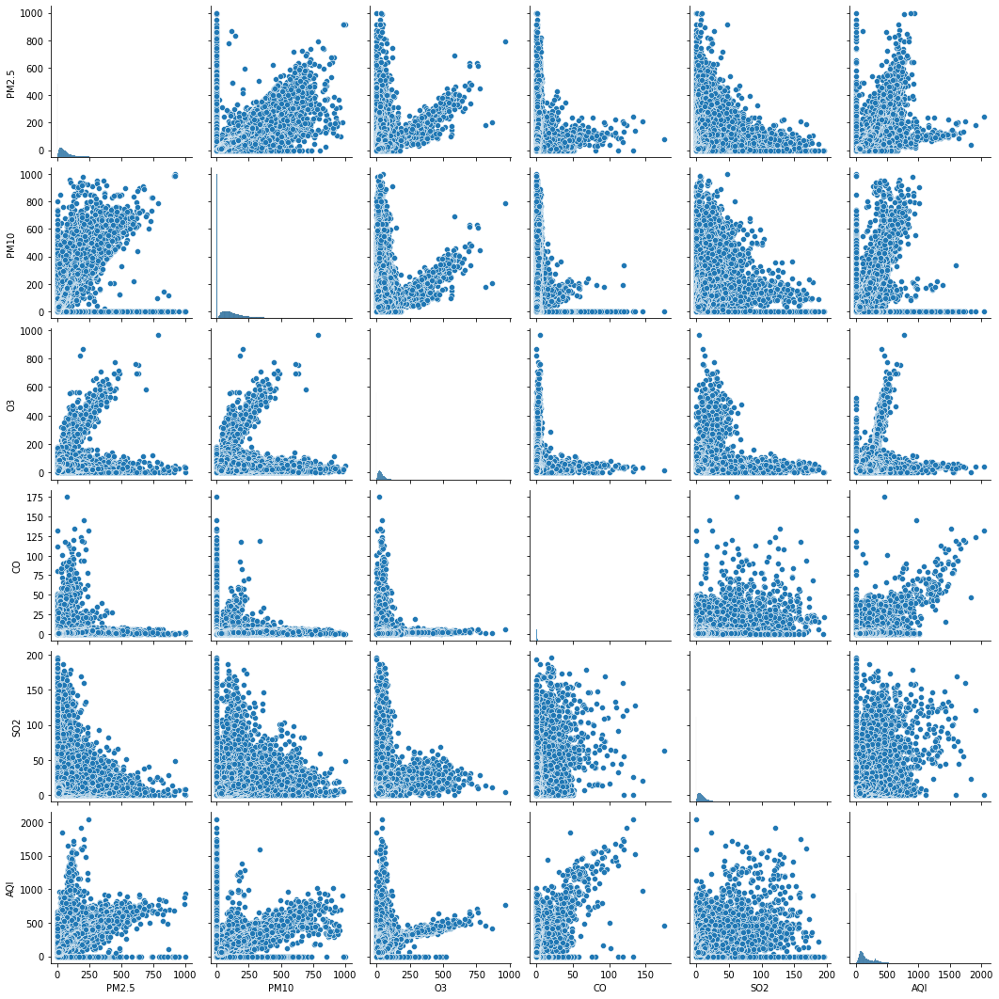

In [9]:
sns.pairplot(data=data[['PM2.5', 'PM10', 'O3', 'CO', 'SO2', 'AQI']])

In [10]:
# Create new features for year, month, and day
data['Year'] = data['Date'].dt.year
data['Month'] = data['Date'].dt.month
data['Day'] = data['Date'].dt.day

#Label Encoding for 'State'
# le = LabelEncoder()
# data['StateCode'] = le.fit_transform(data['StateCode'])

In [11]:
data.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Year,Month,Day
count,108035.000000,108035.000000,108035.000000,108035.000000,108035.000000,108035.000000,108035.000000,108035.000000,108035.000000,108035.00000,108035.000000,108035.000000,108035.000000,108035.000000,108035.000000,108035.000000
mean,64.204683,95.523852,19.462117,29.843168,35.284717,15.938920,1.412557,9.397992,29.109691,2.38032,9.848125,0.513649,144.792725,2018.147138,6.287907,15.755357
std,75.602175,123.190387,32.749395,29.976360,44.207286,23.405063,4.131456,12.495744,37.833664,9.51582,24.635592,3.140014,137.672217,1.448396,3.429975,8.800605
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,2015.000000,1.000000,1.000000
25%,14.385000,0.000000,2.540000,9.110000,7.485000,0.000000,0.340000,1.460000,4.020000,0.00000,0.000000,0.000000,52.000000,2017.000000,3.000000,8.000000
50%,43.150000,55.380000,7.960000,22.560000,22.020000,6.270000,0.800000,6.490000,23.360000,0.26000,0.430000,0.000000,107.000000,2018.000000,6.000000,16.000000
75%,83.795000,144.955000,20.740000,42.240000,45.040000,26.000000,1.350000,12.570000,41.020000,2.35000,7.870000,0.000000,211.000000,2019.000000,9.000000,23.000000
max,1000.000000,1000.000000,470.000000,448.050000,467.630000,418.900000,175.810000,195.650000,963.000000,455.03000,454.850000,170.370000,2049.000000,2020.000000,12.000000,31.000000


In [27]:
#State list
print(data['StationId'].unique())

['AP001' 'AP005' 'AS001' 'BR005' 'BR006' 'BR007' 'BR008' 'BR009' 'BR010'
 'CH001' 'DL001' 'DL002' 'DL003' 'DL004' 'DL005' 'DL006' 'DL007' 'DL008'
 'DL009' 'DL010' 'DL011' 'DL012' 'DL013' 'DL014' 'DL015' 'DL016' 'DL017'
 'DL018' 'DL019' 'DL020' 'DL021' 'DL022' 'DL023' 'DL024' 'DL025' 'DL026'
 'DL027' 'DL028' 'DL029' 'DL030' 'DL031' 'DL032' 'DL033' 'DL034' 'DL035'
 'DL036' 'DL037' 'DL038' 'GJ001' 'HR011' 'HR012' 'HR013' 'HR014' 'JH001'
 'KA002' 'KA003' 'KA004' 'KA005' 'KA006' 'KA007' 'KA008' 'KA009' 'KA010'
 'KA011' 'KL002' 'KL004' 'KL007' 'KL008' 'MH005' 'MH006' 'MH007' 'MH008'
 'MH009' 'MH010' 'MH011' 'MH012' 'MH013' 'MH014' 'ML001' 'MP001' 'MZ001'
 'OD001' 'OD002' 'PB001' 'RJ004' 'RJ005' 'RJ006' 'TG001' 'TG002' 'TG003'
 'TG004' 'TG005' 'TG006' 'TN001' 'TN002' 'TN003' 'TN004' 'TN005' 'UP012'
 'UP013' 'UP014' 'UP015' 'UP016' 'WB007' 'WB008' 'WB009' 'WB010' 'WB011'
 'WB012' 'WB013']


## Visualization of trends

<Figure size 1008x432 with 0 Axes>

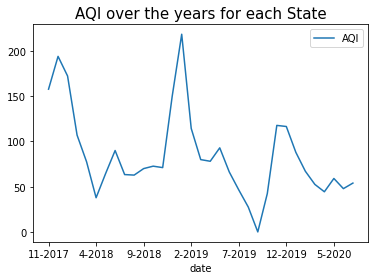

<Figure size 1008x432 with 0 Axes>

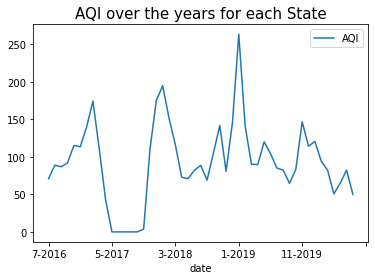

<Figure size 1008x432 with 0 Axes>

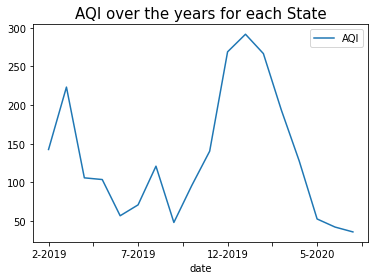

<Figure size 1008x432 with 0 Axes>

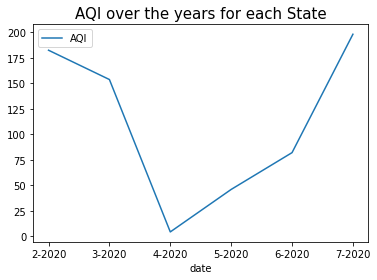

<Figure size 1008x432 with 0 Axes>

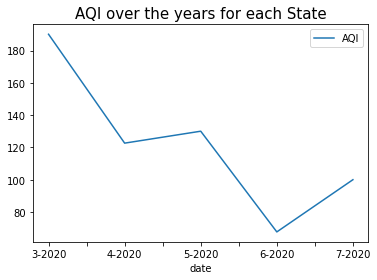

<Figure size 1008x432 with 0 Axes>

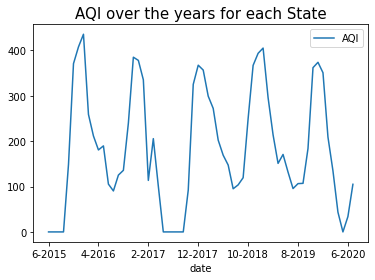

<Figure size 1008x432 with 0 Axes>

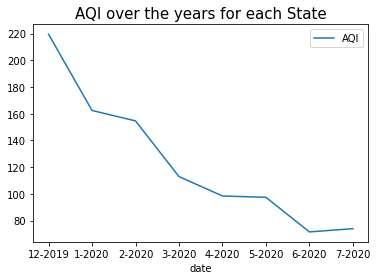

<Figure size 1008x432 with 0 Axes>

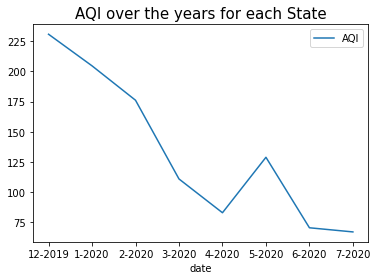

<Figure size 1008x432 with 0 Axes>

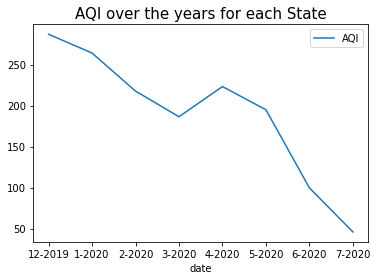

<Figure size 1008x432 with 0 Axes>

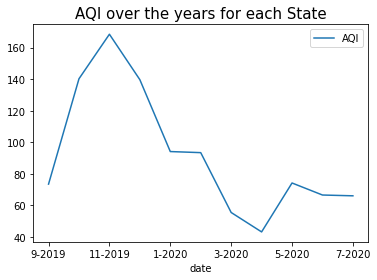

<Figure size 1008x432 with 0 Axes>

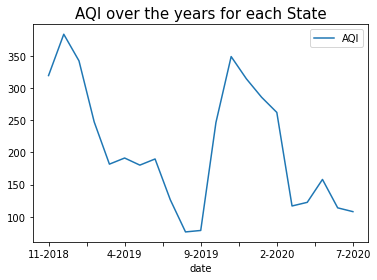

<Figure size 1008x432 with 0 Axes>

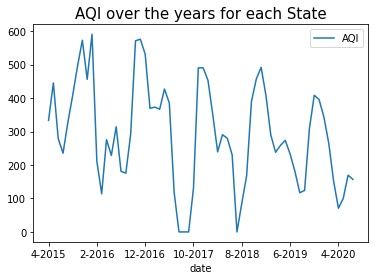

<Figure size 1008x432 with 0 Axes>

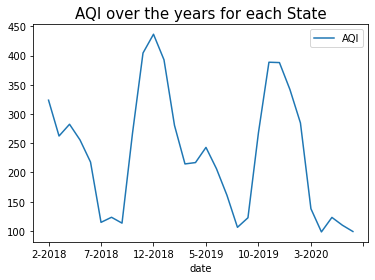

<Figure size 1008x432 with 0 Axes>

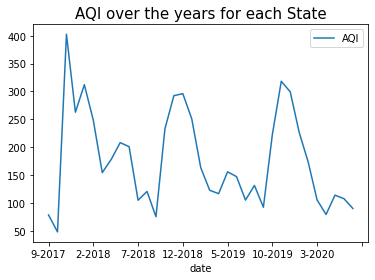

<Figure size 1008x432 with 0 Axes>

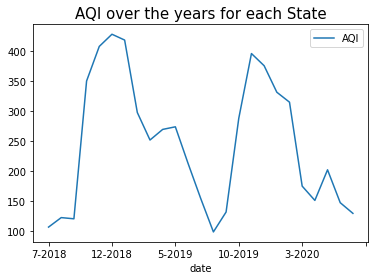

<Figure size 1008x432 with 0 Axes>

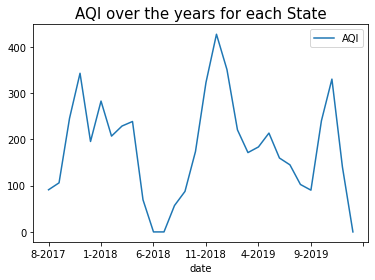

<Figure size 1008x432 with 0 Axes>

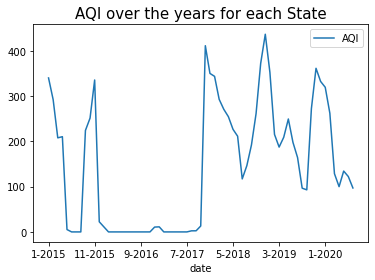

<Figure size 1008x432 with 0 Axes>

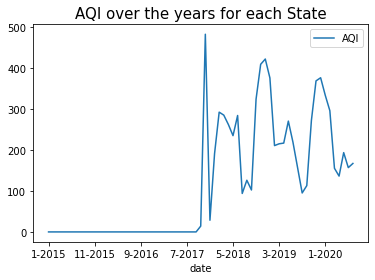

<Figure size 1008x432 with 0 Axes>

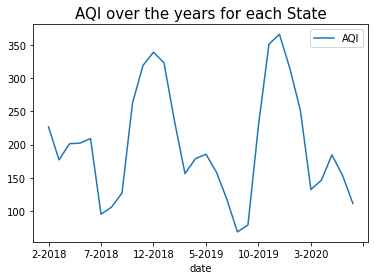

<Figure size 1008x432 with 0 Axes>

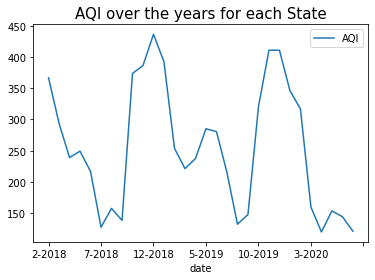

<Figure size 1008x432 with 0 Axes>

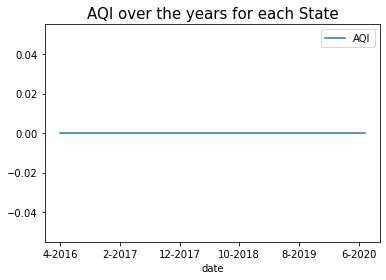

<Figure size 1008x432 with 0 Axes>

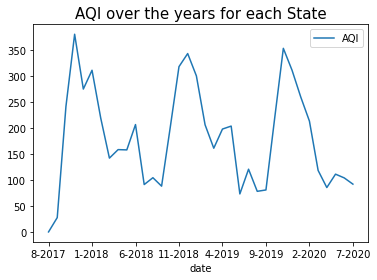

<Figure size 1008x432 with 0 Axes>

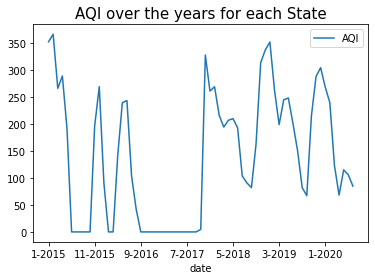

<Figure size 1008x432 with 0 Axes>

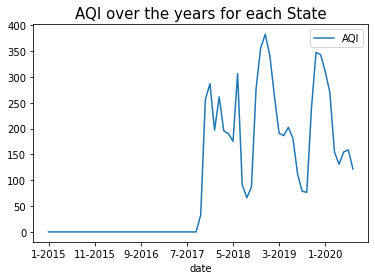

<Figure size 1008x432 with 0 Axes>

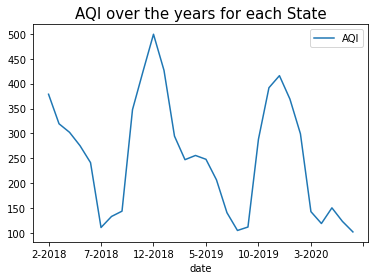

<Figure size 1008x432 with 0 Axes>

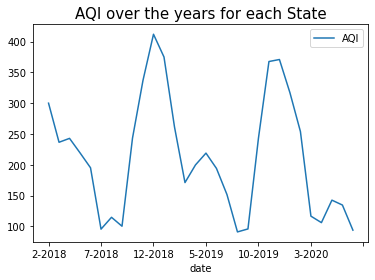

<Figure size 1008x432 with 0 Axes>

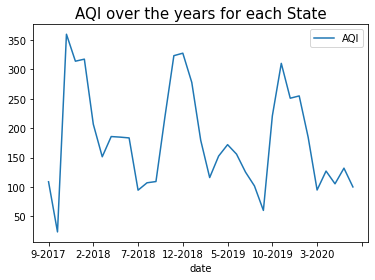

<Figure size 1008x432 with 0 Axes>

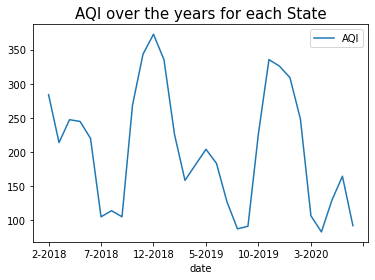

<Figure size 1008x432 with 0 Axes>

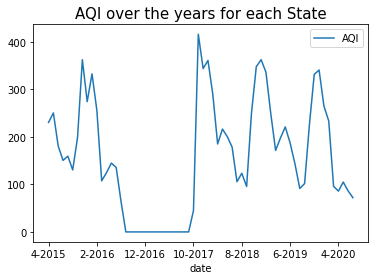

<Figure size 1008x432 with 0 Axes>

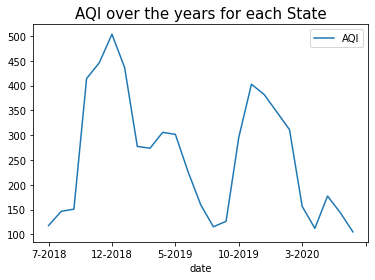

<Figure size 1008x432 with 0 Axes>

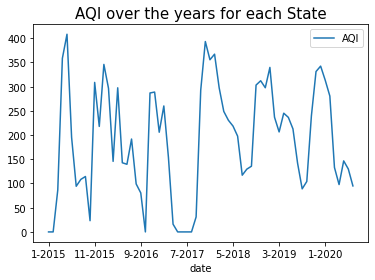

<Figure size 1008x432 with 0 Axes>

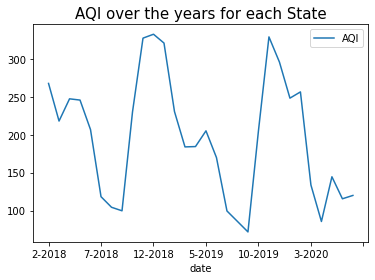

<Figure size 1008x432 with 0 Axes>

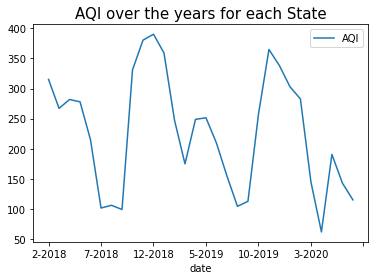

<Figure size 1008x432 with 0 Axes>

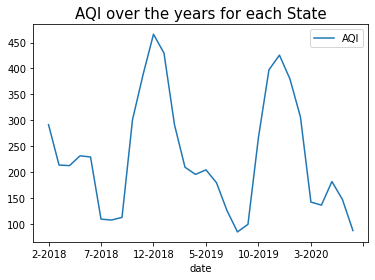

<Figure size 1008x432 with 0 Axes>

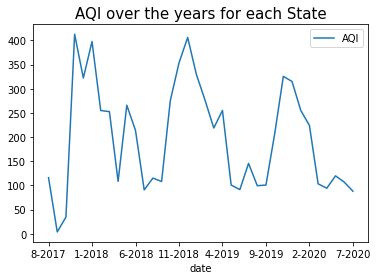

<Figure size 1008x432 with 0 Axes>

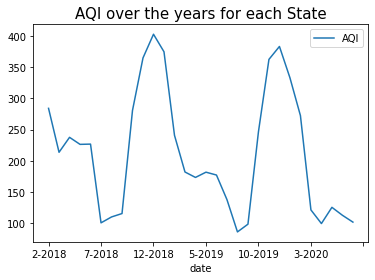

<Figure size 1008x432 with 0 Axes>

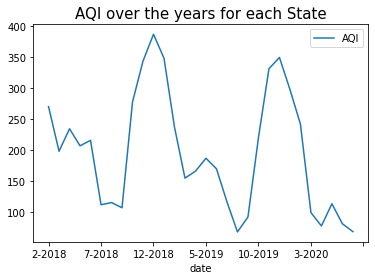

<Figure size 1008x432 with 0 Axes>

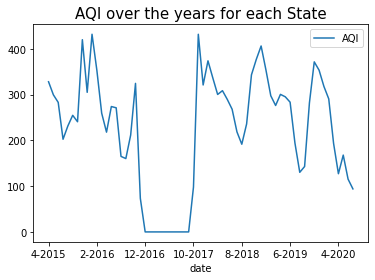

<Figure size 1008x432 with 0 Axes>

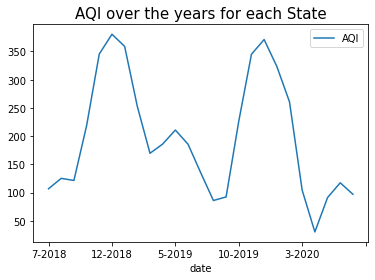

<Figure size 1008x432 with 0 Axes>

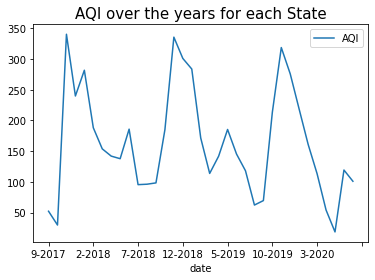

<Figure size 1008x432 with 0 Axes>

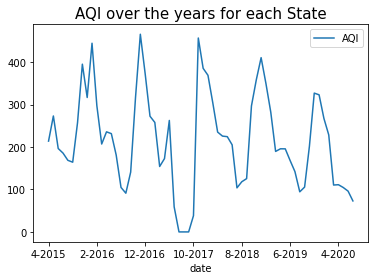

<Figure size 1008x432 with 0 Axes>

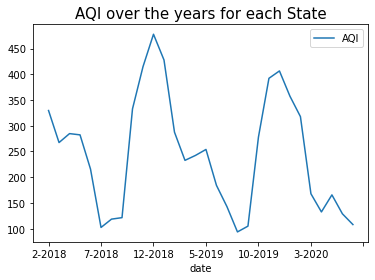

<Figure size 1008x432 with 0 Axes>

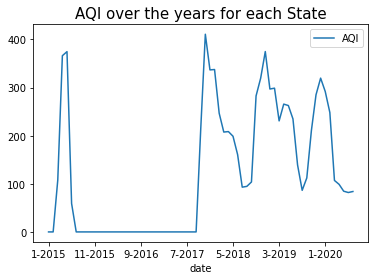

<Figure size 1008x432 with 0 Axes>

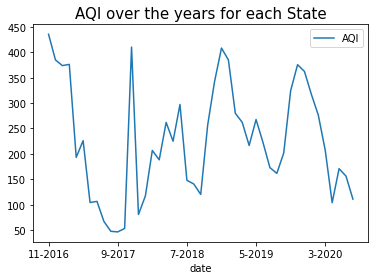

<Figure size 1008x432 with 0 Axes>

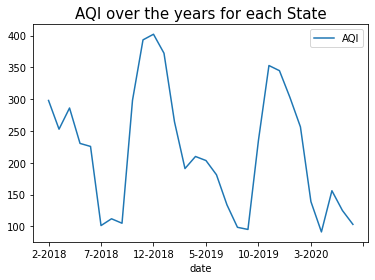

<Figure size 1008x432 with 0 Axes>

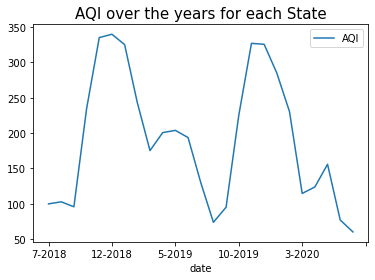

<Figure size 1008x432 with 0 Axes>

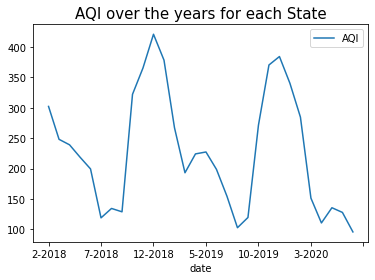

<Figure size 1008x432 with 0 Axes>

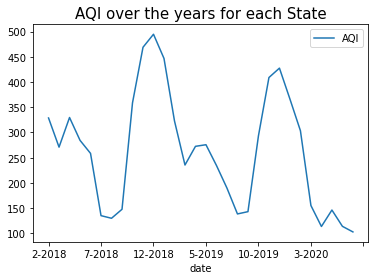

<Figure size 1008x432 with 0 Axes>

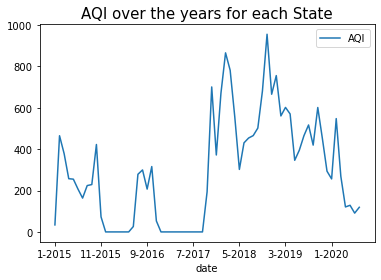

<Figure size 1008x432 with 0 Axes>

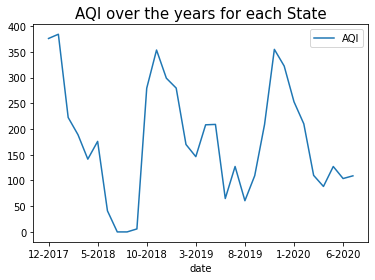

<Figure size 1008x432 with 0 Axes>

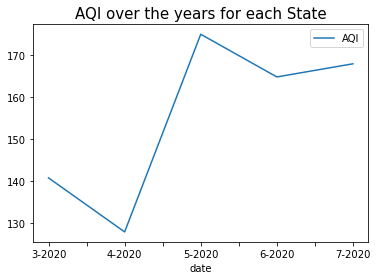

<Figure size 1008x432 with 0 Axes>

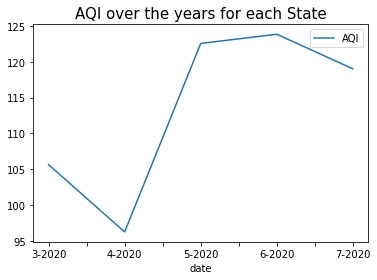

<Figure size 1008x432 with 0 Axes>

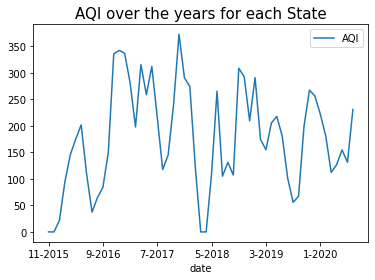

<Figure size 1008x432 with 0 Axes>

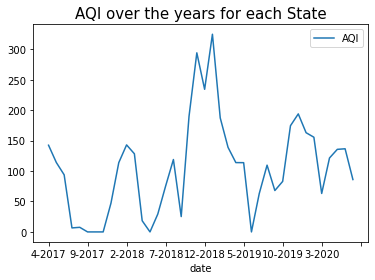

<Figure size 1008x432 with 0 Axes>

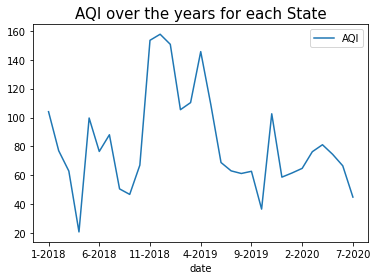

<Figure size 1008x432 with 0 Axes>

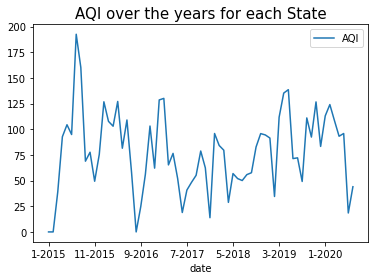

<Figure size 1008x432 with 0 Axes>

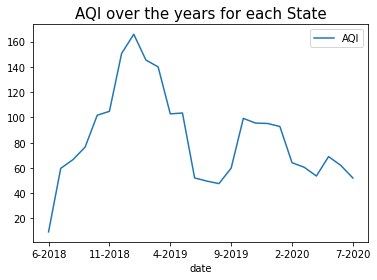

<Figure size 1008x432 with 0 Axes>

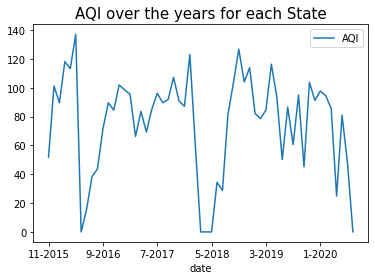

<Figure size 1008x432 with 0 Axes>

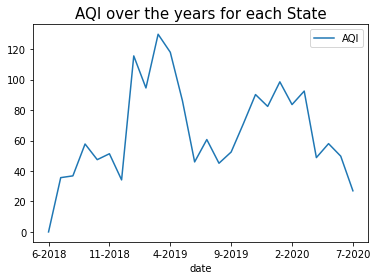

<Figure size 1008x432 with 0 Axes>

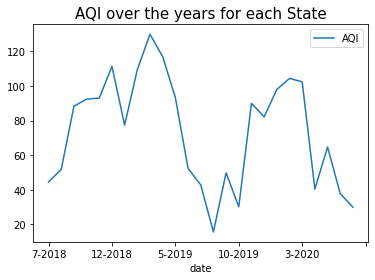

<Figure size 1008x432 with 0 Axes>

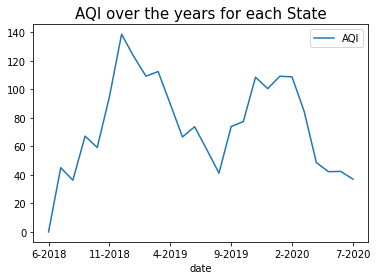

<Figure size 1008x432 with 0 Axes>

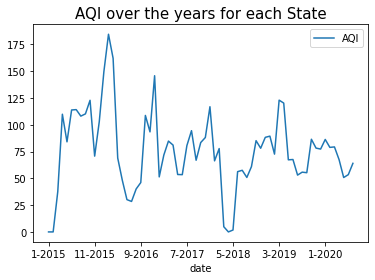

<Figure size 1008x432 with 0 Axes>

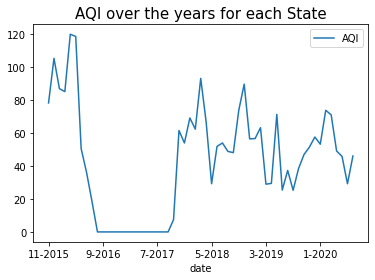

<Figure size 1008x432 with 0 Axes>

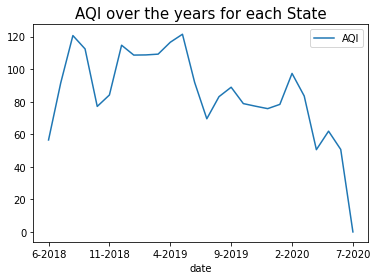

<Figure size 1008x432 with 0 Axes>

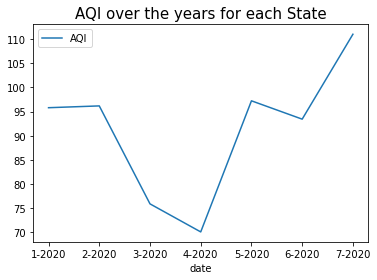

<Figure size 1008x432 with 0 Axes>

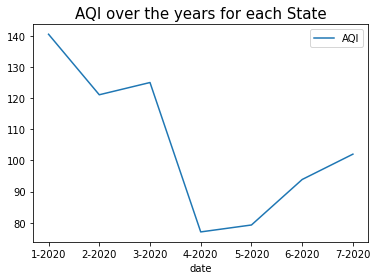

<Figure size 1008x432 with 0 Axes>

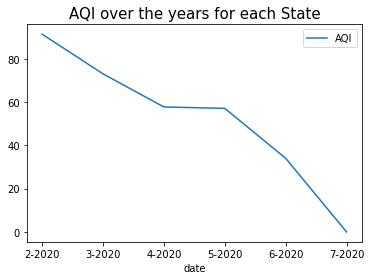

<Figure size 1008x432 with 0 Axes>

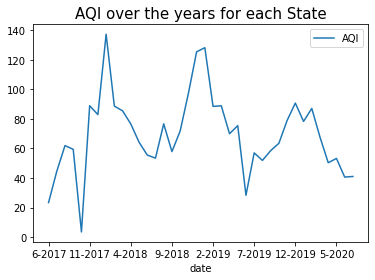

<Figure size 1008x432 with 0 Axes>

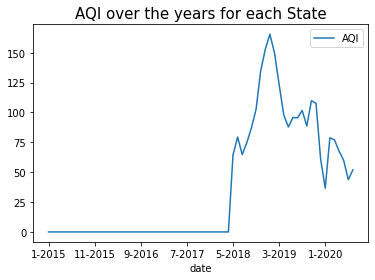

<Figure size 1008x432 with 0 Axes>

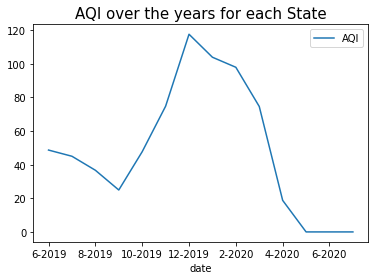

<Figure size 1008x432 with 0 Axes>

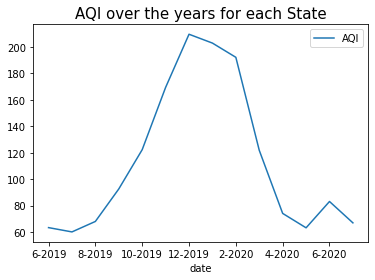

<Figure size 1008x432 with 0 Axes>

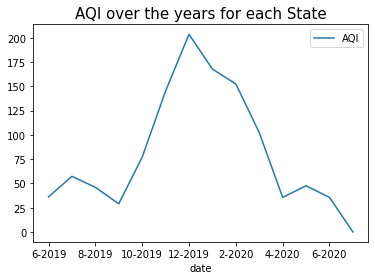

<Figure size 1008x432 with 0 Axes>

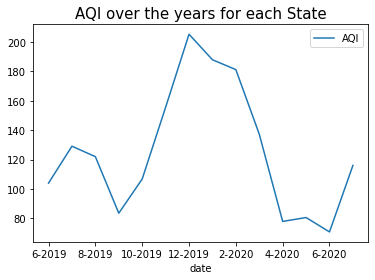

<Figure size 1008x432 with 0 Axes>

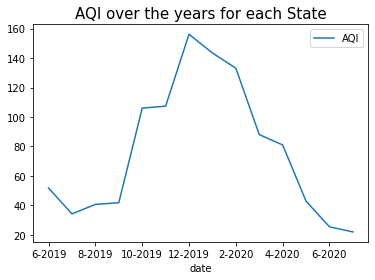

<Figure size 1008x432 with 0 Axes>

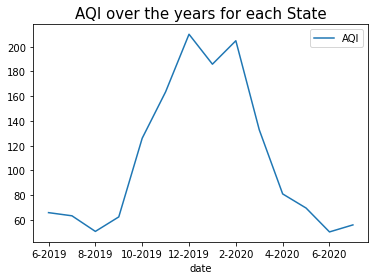

<Figure size 1008x432 with 0 Axes>

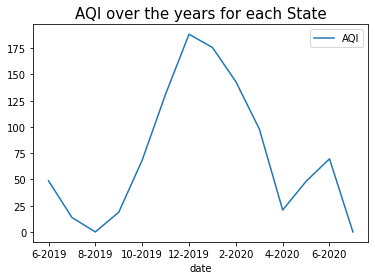

<Figure size 1008x432 with 0 Axes>

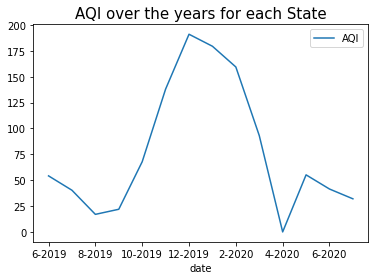

<Figure size 1008x432 with 0 Axes>

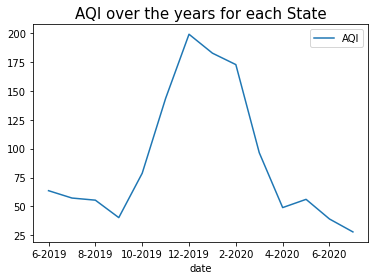

<Figure size 1008x432 with 0 Axes>

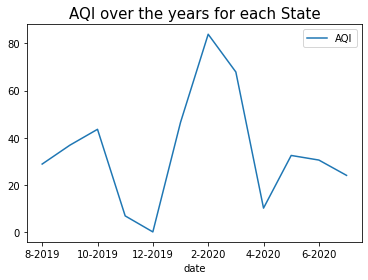

<Figure size 1008x432 with 0 Axes>

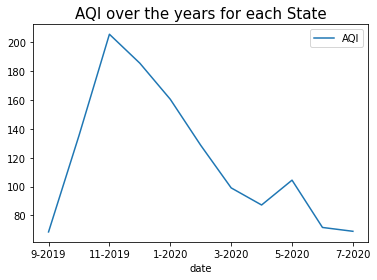

<Figure size 1008x432 with 0 Axes>

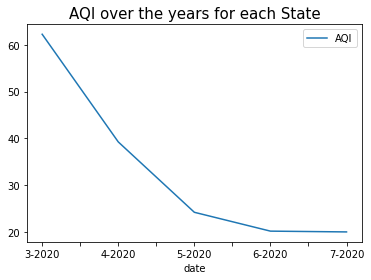

<Figure size 1008x432 with 0 Axes>

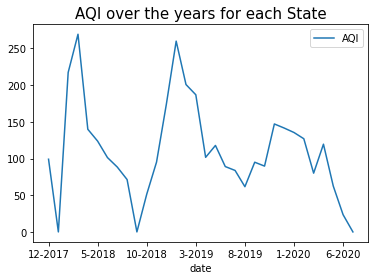

<Figure size 1008x432 with 0 Axes>

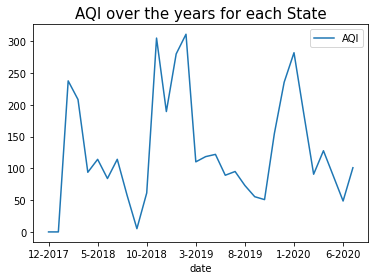

<Figure size 1008x432 with 0 Axes>

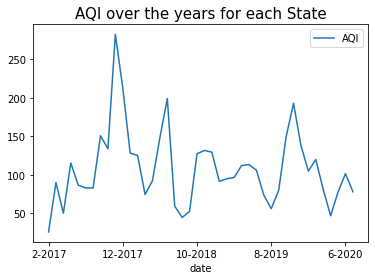

<Figure size 1008x432 with 0 Axes>

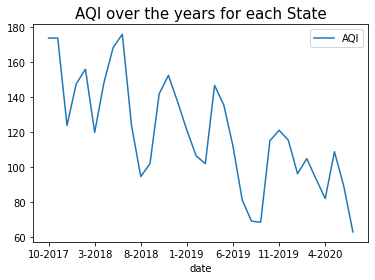

<Figure size 1008x432 with 0 Axes>

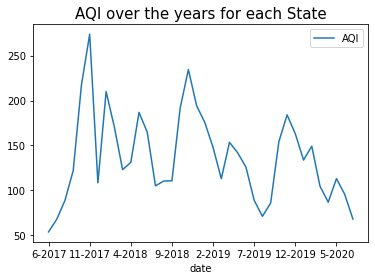

<Figure size 1008x432 with 0 Axes>

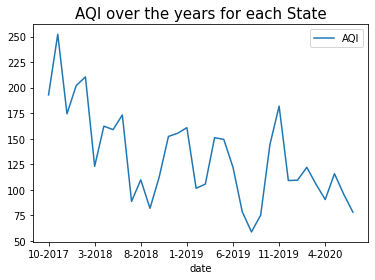

<Figure size 1008x432 with 0 Axes>

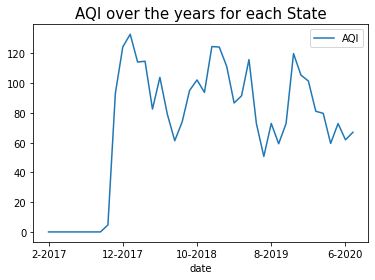

<Figure size 1008x432 with 0 Axes>

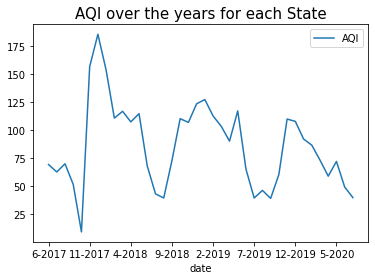

<Figure size 1008x432 with 0 Axes>

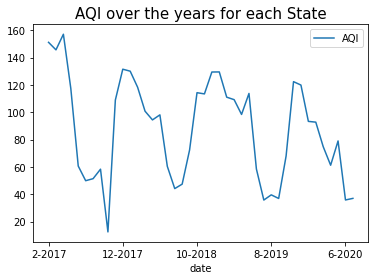

<Figure size 1008x432 with 0 Axes>

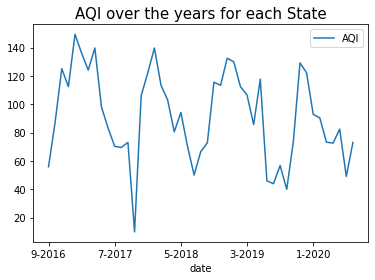

<Figure size 1008x432 with 0 Axes>

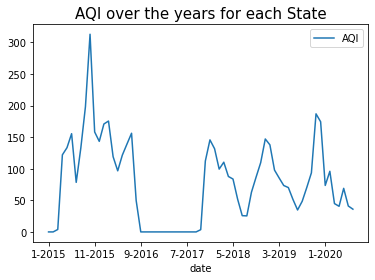

<Figure size 1008x432 with 0 Axes>

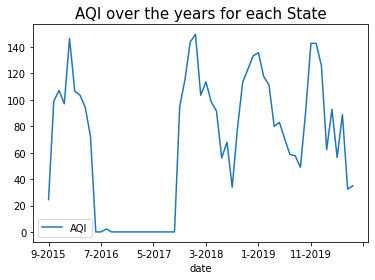

<Figure size 1008x432 with 0 Axes>

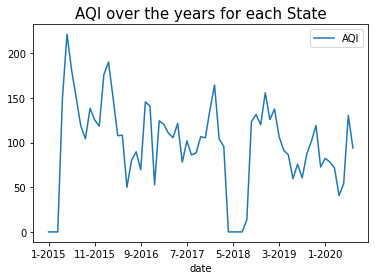

<Figure size 1008x432 with 0 Axes>

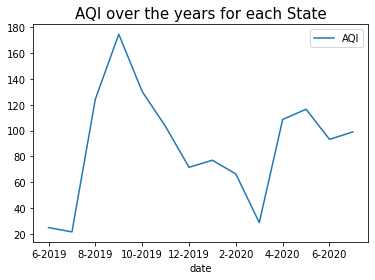

<Figure size 1008x432 with 0 Axes>

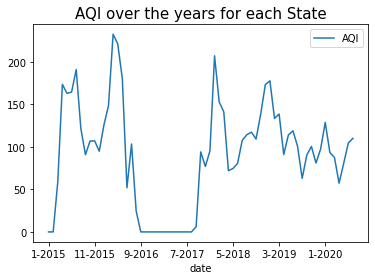

<Figure size 1008x432 with 0 Axes>

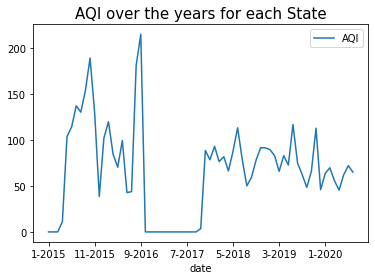

<Figure size 1008x432 with 0 Axes>

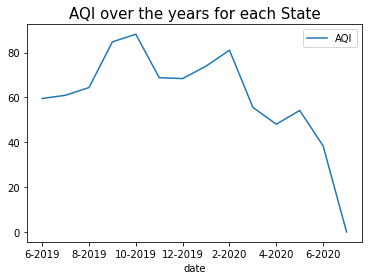

<Figure size 1008x432 with 0 Axes>

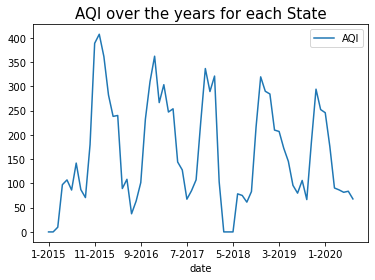

<Figure size 1008x432 with 0 Axes>

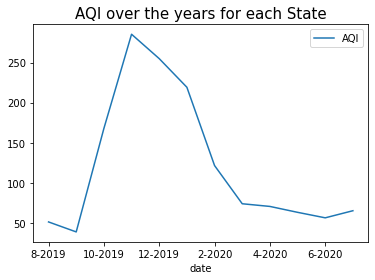

<Figure size 1008x432 with 0 Axes>

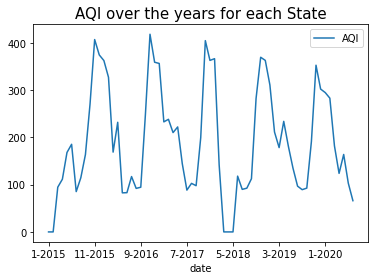

<Figure size 1008x432 with 0 Axes>

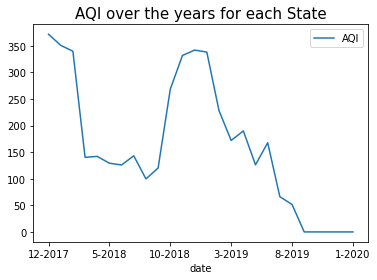

<Figure size 1008x432 with 0 Axes>

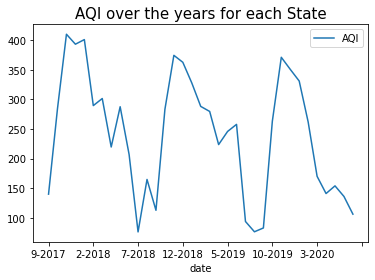

<Figure size 1008x432 with 0 Axes>

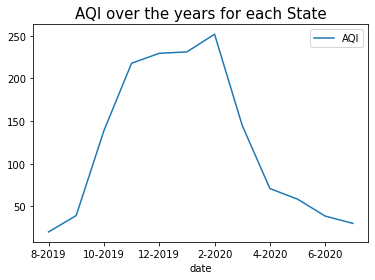

<Figure size 1008x432 with 0 Axes>

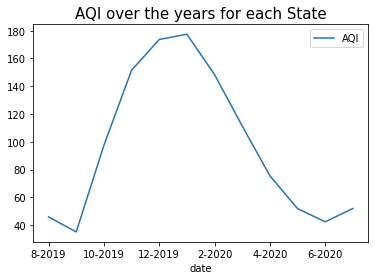

<Figure size 1008x432 with 0 Axes>

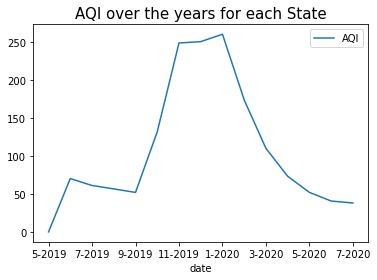

<Figure size 1008x432 with 0 Axes>

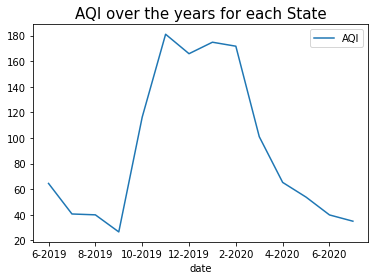

<Figure size 1008x432 with 0 Axes>

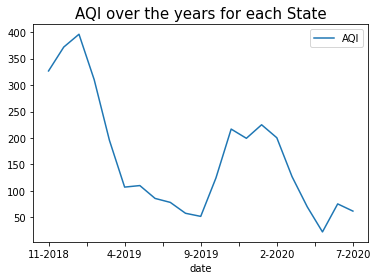

<Figure size 1008x432 with 0 Axes>

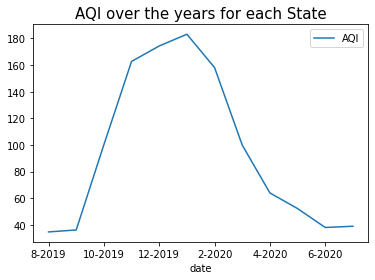

<Figure size 1008x432 with 0 Axes>

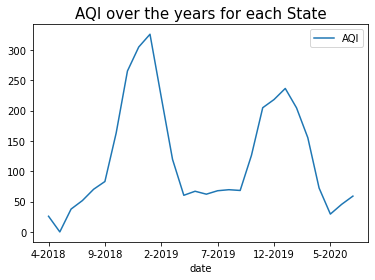

In [12]:
def visualize_aqi_trend(sub_data_by_year):
    plt.figure(figsize=(14,6))
    sub_data_by_year.plot(kind = 'line', x= 'date', y = 'AQI')
    plt.title('AQI over the years for each State', fontsize=15)
  
 def aqi_trend(sub_data):
    sub_data_by_year = sub_data.groupby(['Year', 'Month'], as_index = False).AQI.mean()
    cols=["Month", "Year"]
    sub_data_by_year['date'] = sub_data_by_year[cols].apply(lambda x: '-'.join(x.values.astype(str)), axis="columns")
    # print(sub_data_by_year)
    visualize_aqi_trend(sub_data_by_year)
  
 for state in data['StationId'].unique():
    sub_data = data[data['StationId'] == state]
  #print(sub_data)

    aqi_trend(sub_data)
    

<AxesSubplot:xlabel='Month', ylabel='AQI'>

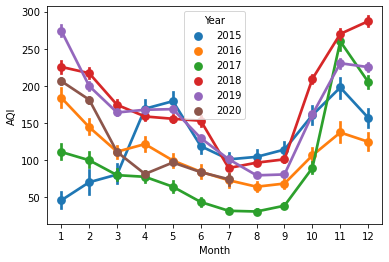

In [13]:
sns.pointplot(x='Month',y='AQI',hue='Year',data=data)

## Modeling ARIMA with Box-Cox Transformation

### Scaling the data

In [15]:
scaler = MinMaxScaler()
data[['AQI']] = scaler.fit_transform(data['AQI'].values.reshape(-1,1))
data

,StationId,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket,Year,Month,Day
0,AP001,2017-11-24,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,0.17,5.92,0.10,0.000000,0,2017,11,24
1,AP001,2017-11-25,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,0.20,6.50,0.06,0.089800,Moderate,2017,11,25
2,AP001,2017-11-26,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,0.22,7.95,0.08,0.096144,Moderate,2017,11,26
3,AP001,2017-11-27,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,0.29,7.63,0.12,0.096633,Moderate,2017,11,27
4,AP001,2017-11-28,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,0.17,5.02,0.07,0.091752,Moderate,2017,11,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108030,WB013,2020-06-27,8.65,16.46,0.00,0.00,0.00,0.00,0.69,4.36,30.59,1.32,7.26,0.00,0.024402,Good,2020,6,27
108031,WB013,2020-06-28,11.80,18.47,0.00,0.00,0.00,0.00,0.68,3.49,38.95,1.42,7.92,0.00,0.031723,Satisfactory,2020,6,28
108032,WB013,2020-06-29,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,3.52,8.64,0.00,0.030747,Satisfactory,2020,6,29
108033,WB013,2020-06-30,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,1.86,8.40,0.00,0.027818,Satisfactory,2020,6,30


In [16]:
view = scaler.inverse_transform(data[['AQI']])
view

array([[  0.],
       [184.],
       [197.],
       ...,
       [ 63.],
       [ 57.],
       [ 59.]])

### Feature engineering

In [17]:
import numpy as np
a = data['StationId'].astype(str)
data['State_Station']= a
data['AQI'].isna()

0         False
1         False
2         False
3         False
4         False
          ...  
108030    False
108031    False
108032    False
108033    False
108034    False
Name: AQI, Length: 108035, dtype: bool

### Checking for stationarity

In [19]:
non_stationary_state_station = []
data = data.replace([np.nan, -np.inf], 0)
for state in data['StationId'].unique():
    state_data = data[data['StationId'] == state]
    for station in state_data['StationId'].unique():  
        state_station_data = state_data[state_data['StationId'] == station]
        result = adfuller(state_station_data['AQI'])
    # print('ADF Statistic: %f' % result[0])
    # print('p-value: %f' % result[1])
    # print('Critical Values:')
    # for key, value in result[4].items():
    #   print('\t%s: %.3f' % (key, value))
    if result[1] > 0.05:
        non_stationary_state_station.append(str(state))
     

In [20]:
non_stationary_state_station = sorted(non_stationary_state_station)
non_stationary_state_station

['BR009',
 'BR010',
 'CH001',
 'DL001',
 'DL005',
 'DL014',
 'DL026',
 'DL027',
 'DL029',
 'DL033',
 'DL036',
 'DL037',
 'JH001',
 'MH005',
 'MH006',
 'MH007',
 'MH008',
 'MH009',
 'MH010',
 'MH011',
 'MH012',
 'MH013',
 'MH014',
 'MP001',
 'MZ001',
 'RJ004',
 'TG006',
 'UP013',
 'UP015',
 'UP016',
 'WB007',
 'WB008',
 'WB009',
 'WB010',
 'WB011',
 'WB012',
 'WB013']

### Checking the order of differencing

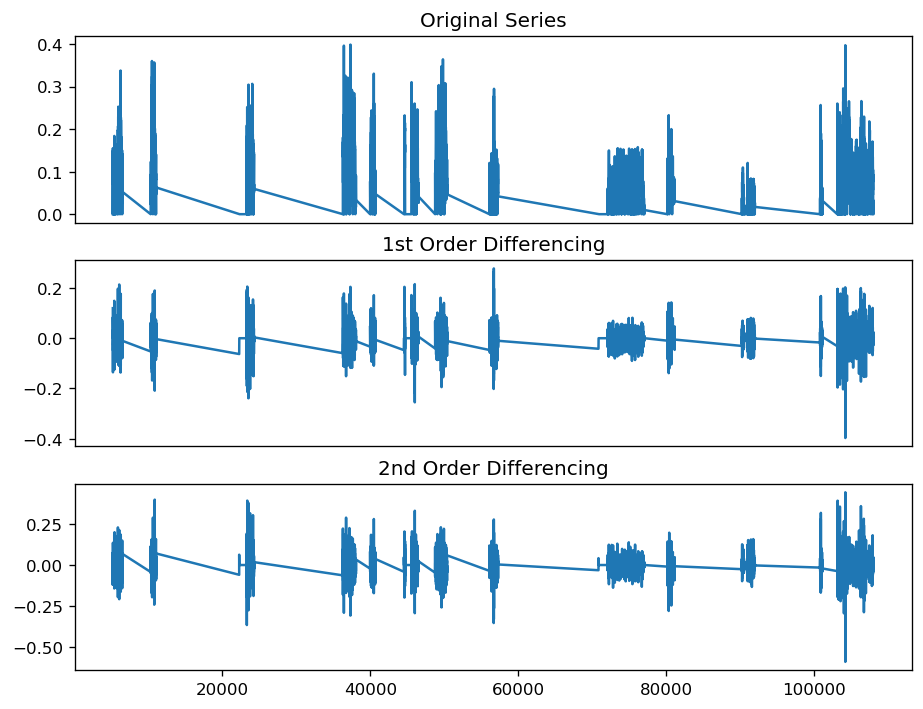

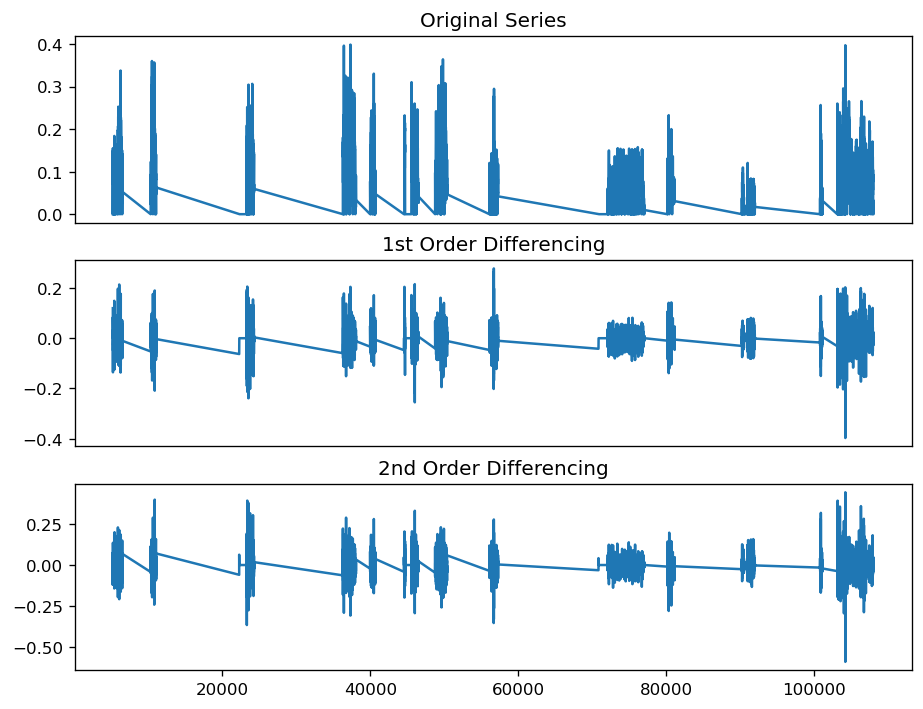

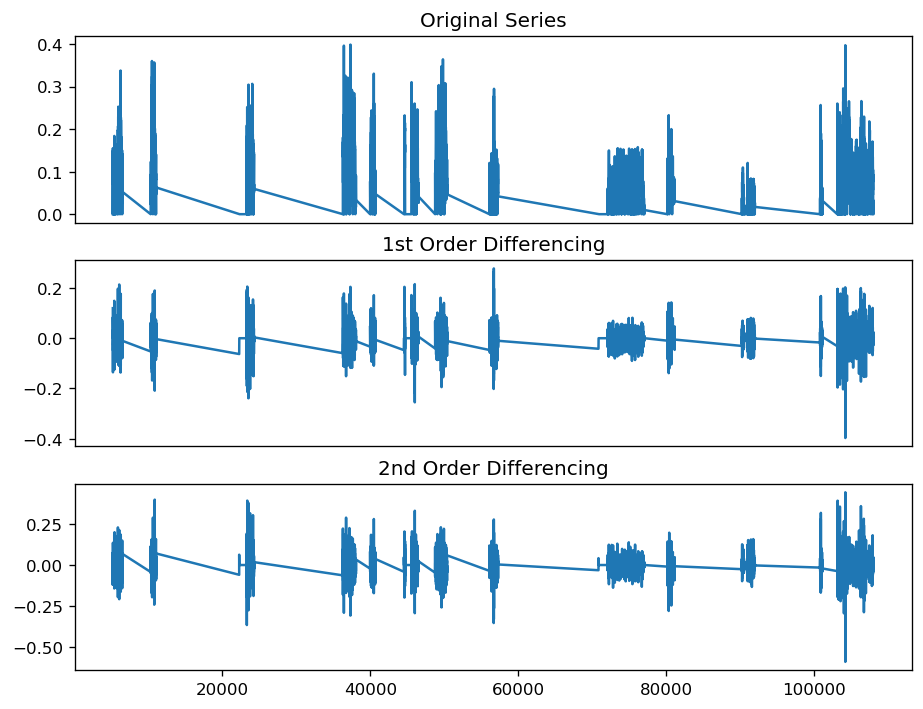

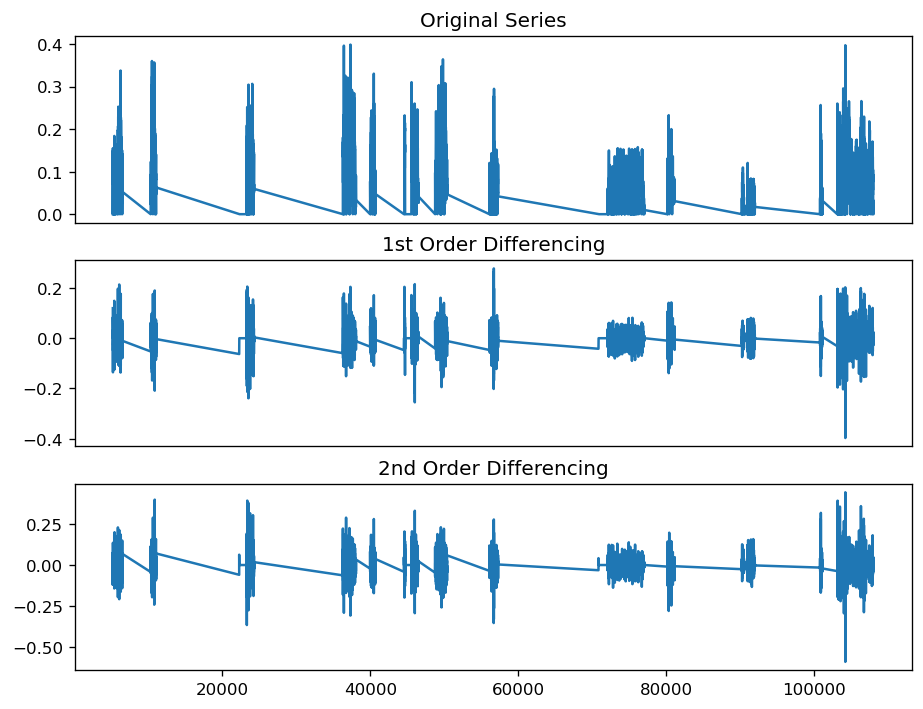

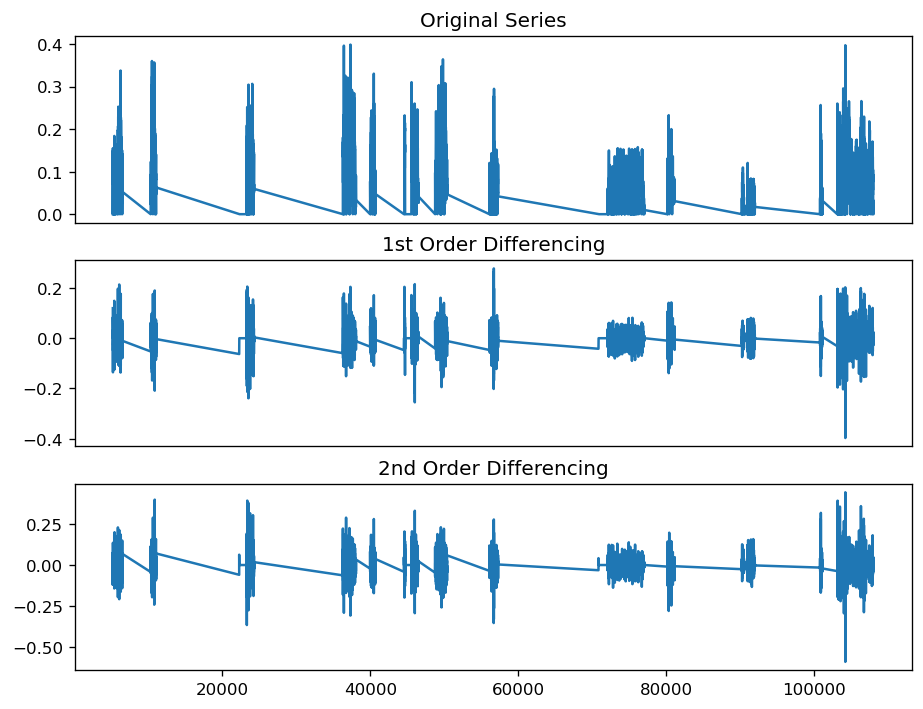

...

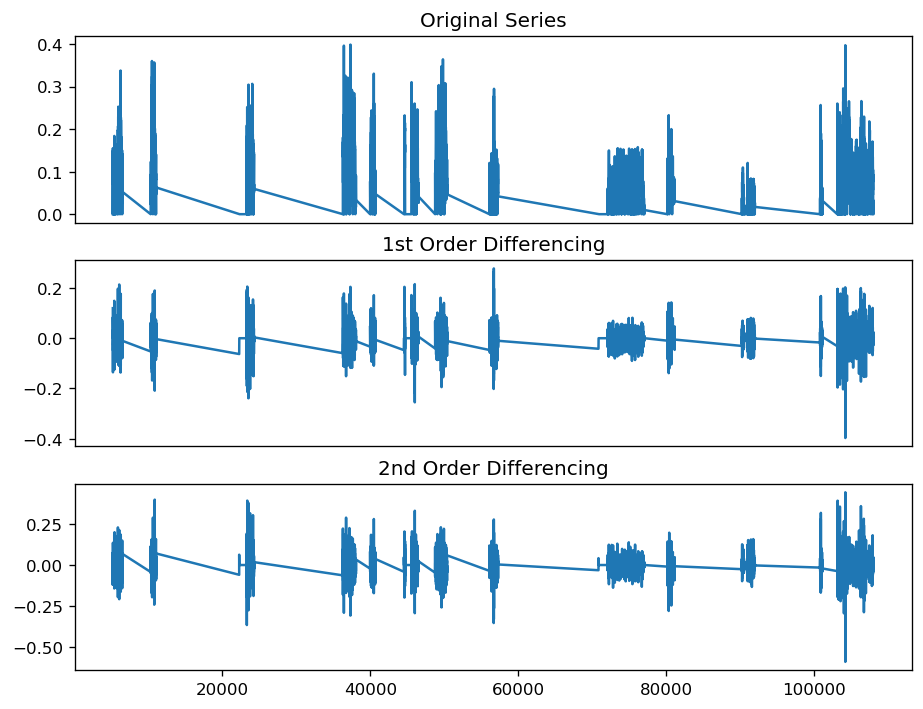

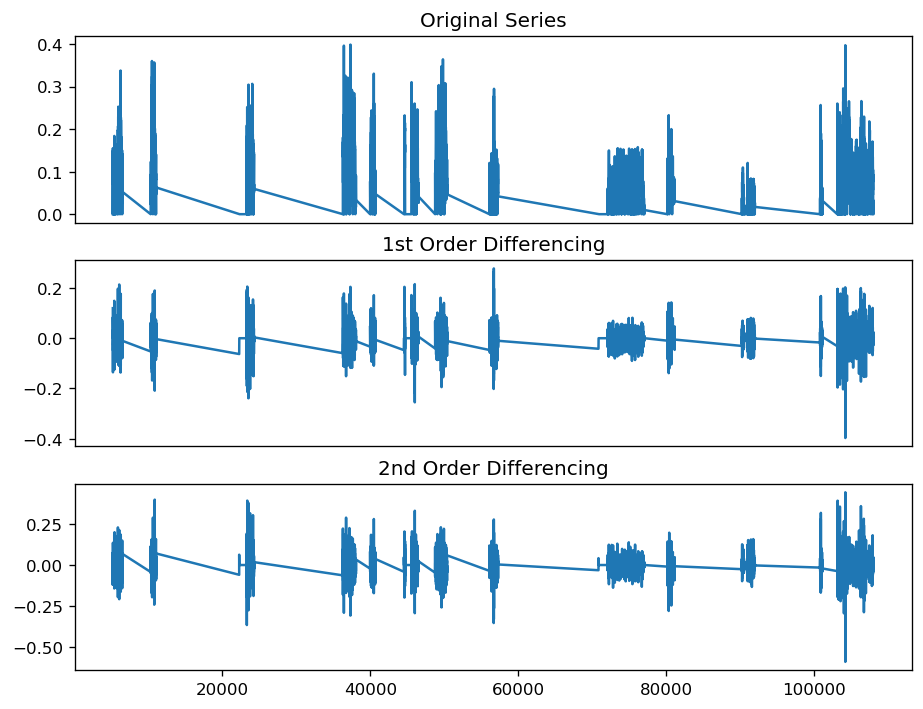

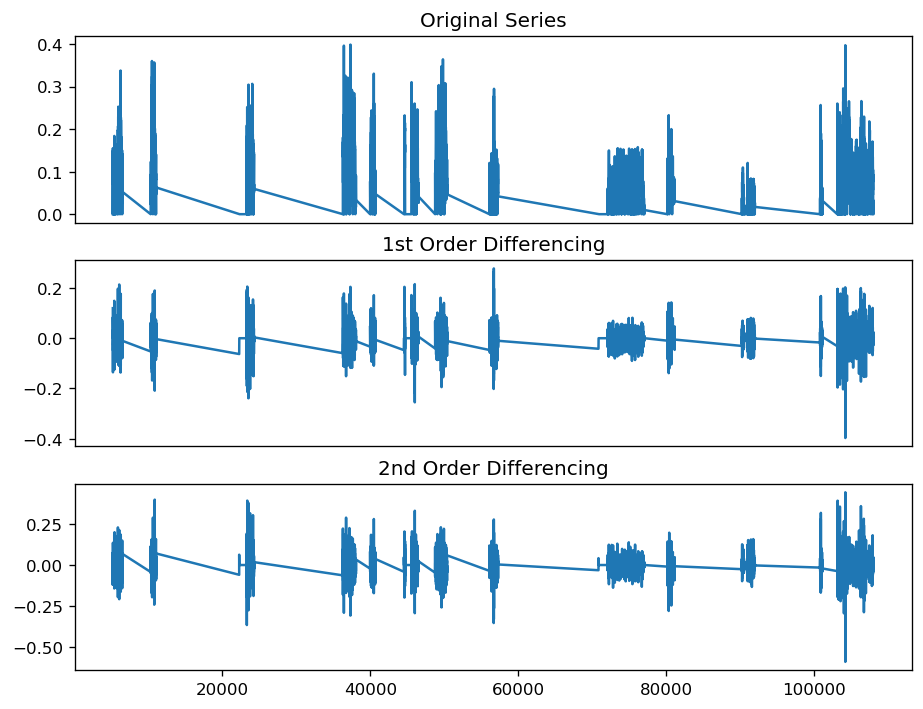

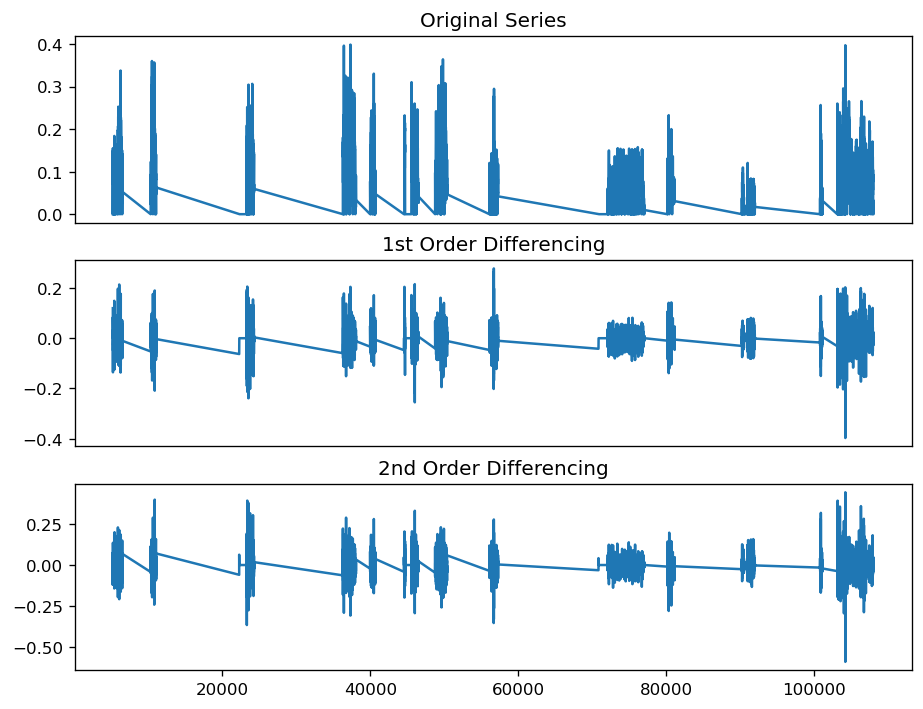

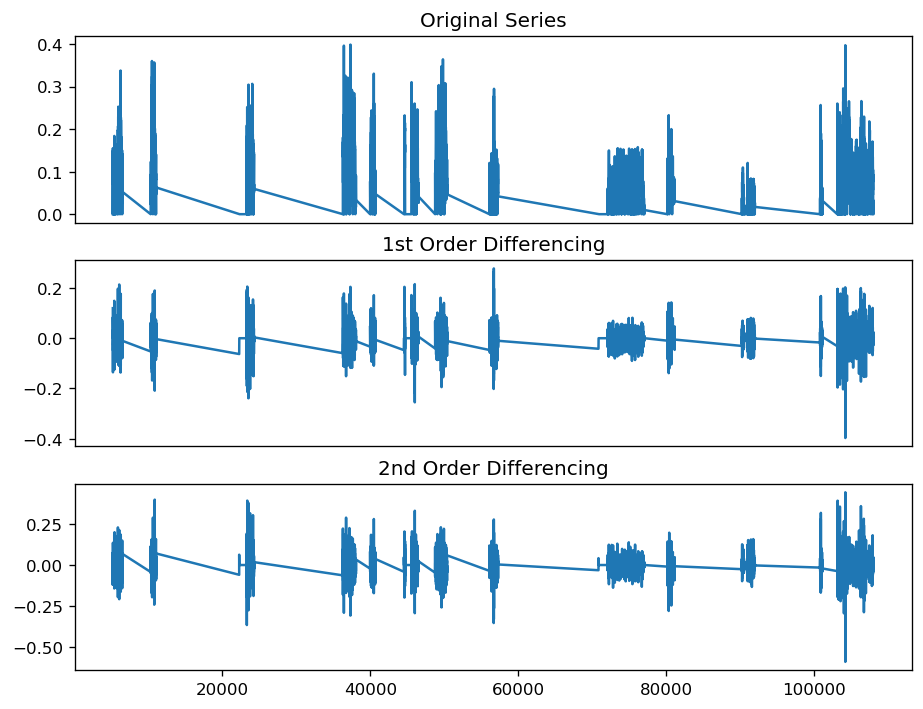

In [21]:
plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

non_stationary_data = data[data['State_Station'].isin(non_stationary_state_station)]

for state in data['StationId'].unique():
    state_data = data[data['StationId'] == state]
      for station in state_data['StationId'].unique():  
        state_station_data = state_data[state_data['StationId'] == station]
        # Original Series
        fig, (ax1, ax2, ax3) = plt.subplots(3)
        ax1.plot(non_stationary_data.AQI); ax1.set_title('Original Series'); ax1.axes.xaxis.set_visible(False)
        # 1st Differencing
        ax2.plot(non_stationary_data.AQI.diff()); ax2.set_title('1st Order Differencing'); ax2.axes.xaxis.set_visible(False)
        # 2nd Differencing
        ax3.plot(non_stationary_data.AQI.diff().diff()); ax3.set_title('2nd Order Differencing')
        plt.show()

### Model

In [22]:
data = data.replace([np.nan, -np.inf], 0)
def create_aqi_dict(data):
    aqi = dict()
    for state_station in data['State_Station'].unique():
        aqi[state_station] = data[data['State_Station'] == state_station][['AQI']]
    return aqi


# non_stationary_aqi = create_aqi_dict(non_stationary_data)
# stationary_aqi = create_aqi_dict(stationary_data)
aqi = create_aqi_dict(data)

res_bc = pd.DataFrame(columns=['ID_Date', 'AQI'])
pred_days = 28

# model_dict = dict()
# model_dict_new = dict()
model_dict_latest = dict()
for code, d in aqi.items():
    if(code == 'DL011'):
        continue
        
    print(f"Working on {code} ...")
    
    # data.dropna(inplace=True)

    pipeline = Pipeline([
        ("BoxCoxTransform", BoxCoxEndogTransformer(lmbda2=1e-6)),
        # ("LogTransform", LogEndogTransformer()),
        ("model", ARIMA(order = (7,1,2), trace=False, suppress_warnings=True, n_fits=50, n_jobs=-1))
    ])

    pipeline.fit(d['AQI'])
    # model = AutoARIMA(df['AQI'], start_p=7, start_q=1, d=None, max_p=10, max_q=3, max_d=1, start_P=0, start_Q=0, D=0, max_P=0, max_Q=0, max_D=0, m=1, seasonal=True, \
    #        trace=False, error_action='warn', suppress_warnings=True, random_state = 42, n_fits=40, n_jobs=-1)
    # model = auto_arima(df['AQI'], trace=False, error_action='warn', suppress_warnings=True, n_fits=40, n_jobs=-1)
    
    # model_dict_latest[code] = model

    # Serialize with Pickle
    file_path = r'C:\H2O_Hackathon_models\arima_boxcox_{code}.pkl'
    with open(file_path, 'wb') as pkl:
        pickle.dump(pipeline, pkl)

    start_date = (data.Date.iloc[-1].date() + timedelta(days=1)).isoformat()
    end_date = (data.Date.iloc[-1].date() + timedelta(days=28)).isoformat()

    date_list = pd.date_range(start_date, end_date, freq='D')
    date_list = [code + '_' + str(day) for day in date_list]
    
    pred = pipeline.predict(n_periods=pred_days)

    #inverse predictions scaling
    yhat = scaler.inverse_transform(pred.reshape(1,-1))

    res_bc = pd.concat([res_bc, pd.DataFrame({'ID_Date': date_list, 'AQI': yhat.flatten()})])
    
res_bc.reset_index(drop=True, inplace=True)


Working on AP001 ...
Working on AP005 ...
Working on AS001 ...
Working on BR005 ...
Working on BR006 ...
Working on BR007 ...
Working on BR008 ...
Working on BR009 ...
Working on BR010 ...
Working on CH001 ...
Working on DL001 ...
Working on DL002 ...
Working on DL003 ...
Working on DL004 ...
Working on DL005 ...
Working on DL006 ...
Working on DL007 ...
Working on DL008 ...
Working on DL009 ...
Working on DL010 ...
Working on DL012 ...
Working on DL013 ...
Working on DL014 ...
Working on DL015 ...
Working on DL016 ...
Working on DL017 ...
Working on DL018 ...
Working on DL019 ...
Working on DL020 ...
Working on DL021 ...
Working on DL022 ...
Working on DL023 ...
Working on DL024 ...
Working on DL025 ...
Working on DL026 ...
Working on DL027 ...
Working on DL028 ...
Working on DL029 ...
Working on DL030 ...
Working on DL031 ...
Working on DL032 ...
Working on DL033 ...
Working on DL034 ...
Working on DL035 ...
Working on DL036 ...
Working on DL037 ...
Working on DL038 ...
Working on GJ

### Saving output and model

In [23]:
res_bc.to_csv(r'C:\Eval\ytest.csv')

Model Results
Below are the results of the models on the test (submission) data.

<hr>

| Model | Transformation Technique	| MAE |
| :---: | :---: | :--: |
| ARIMA (7,1,2) |	Scaler + BoxCox	| 27.9306

<hr>

In [24]:
dt=data[data['StationId']=='AP005']
dt[dt['Date']=='7/1/2020']


,StationId,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket,Year,Month,Day,State_Station
2412,AP005,2020-07-01,15.0,66.0,0.4,26.85,14.05,5.2,0.59,2.1,17.05,0.0,0.0,0.0,0.024402,Good,2020,7,1,AP005


In [25]:
data

,StationId,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket,Year,Month,Day,State_Station
0,AP001,2017-11-24,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,0.17,5.92,0.10,0.000000,0,2017,11,24,AP001
1,AP001,2017-11-25,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,0.20,6.50,0.06,0.089800,Moderate,2017,11,25,AP001
2,AP001,2017-11-26,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,0.22,7.95,0.08,0.096144,Moderate,2017,11,26,AP001
3,AP001,2017-11-27,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,0.29,7.63,0.12,0.096633,Moderate,2017,11,27,AP001
4,AP001,2017-11-28,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,0.17,5.02,0.07,0.091752,Moderate,2017,11,28,AP001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108030,WB013,2020-06-27,8.65,16.46,0.00,0.00,0.00,0.00,0.69,4.36,30.59,1.32,7.26,0.00,0.024402,Good,2020,6,27,WB013
108031,WB013,2020-06-28,11.80,18.47,0.00,0.00,0.00,0.00,0.68,3.49,38.95,1.42,7.92,0.00,0.031723,Satisfactory,2020,6,28,WB013
108032,WB013,2020-06-29,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,3.52,8.64,0.00,0.030747,Satisfactory,2020,6,29,WB013
108033,WB013,2020-06-30,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,1.86,8.40,0.00,0.027818,Satisfactory,2020,6,30,WB013
